In [ ]:
%pip install --upgrade Pillow --target /usr/local/lib/python3.10/site-packages

from PIL import Image

Image.__version__

In [38]:
from PIL import Image
from rgb_cielab import convert_rgb_to_cielab, set_cielab
from util import display_image
%load_ext autoreload
%autoreload 2


# Load the RGB image
rgb_image = Image.open("image.jpg")
cielab_image = convert_rgb_to_cielab(rgb_image)

# size 7
num_steps = 7
import numpy as np

# Define the range for input_a and input_b
input_a_range = (-128, 128)
input_b_range = (-128, 128)

# Initialize the 2D array
result = []

# Simulate a and b value by interpolating between the -128 to 128 range
for i in range(num_steps):
    row = []
    for j in range(num_steps):
        if j == 3:
            input_b = np.interp(i, [0, num_steps - 1], input_b_range)
            input_a = None  # Middle column is for input_a
        elif i == 3:
            input_a = np.interp(j, [0, num_steps - 1], input_a_range)
            input_b = None  # Middle row is for input_b
        else:
            input_a = np.interp(j, [0, num_steps - 1], input_a_range)
            input_b = np.interp(i, [0, num_steps - 1], input_b_range)
        
        result.append(set_cielab(cielab_image, input_a=input_a, input_b=input_b))
    

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


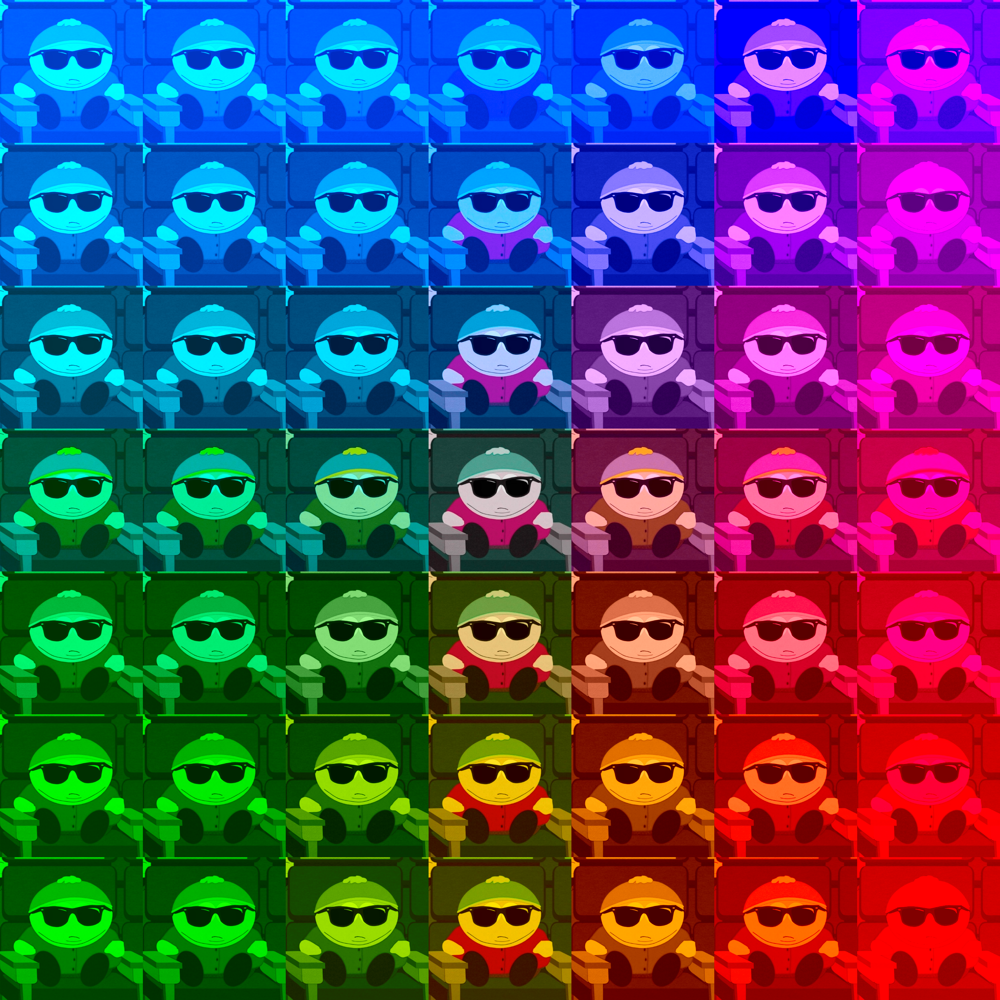

In [39]:
display_image(result, 7, 7)

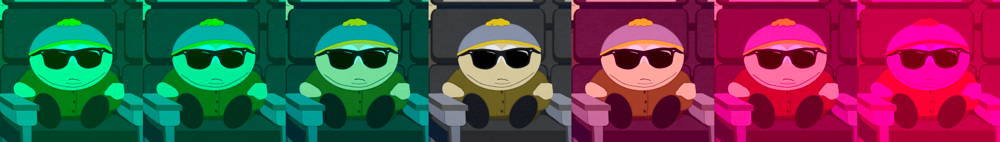

In [40]:
# size 7
values = [-128, -86, -43, 0, 43, 86, 128]
result = []

# simulate the effect of changing input_a (green to red)
for value in values:
    result.append(set_cielab(cielab_image, input_a=value))

display_image(result, 7, 1)

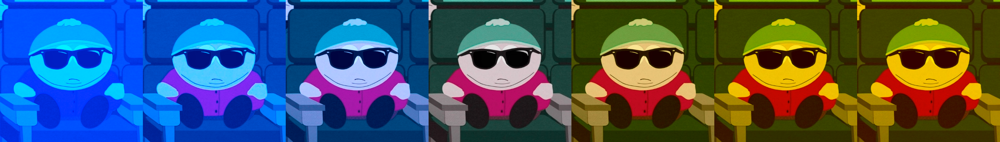

In [41]:
# size 7
value = [-128, -86, -43, 0, 43, 86, 128]
result = []

# simulate the effect of changing input_b (blue to yellow)
for i in value:
    result.append(set_cielab(cielab_image, input_b=i))

display_image(result, 7, 1)

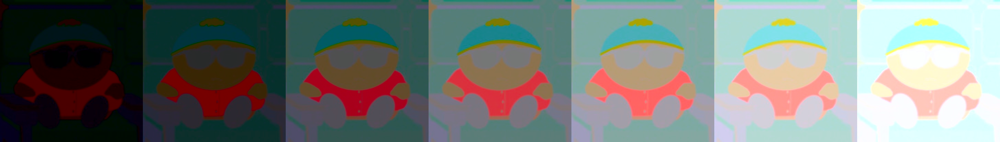

In [42]:
value = [0, 17, 34, 50, 66, 84, 100]
result = []

# simulate the effect of changing input L (dark to light)
for i in value:
    result.append(set_cielab(cielab_image, input_L=i))

display_image(result, 7, 1)

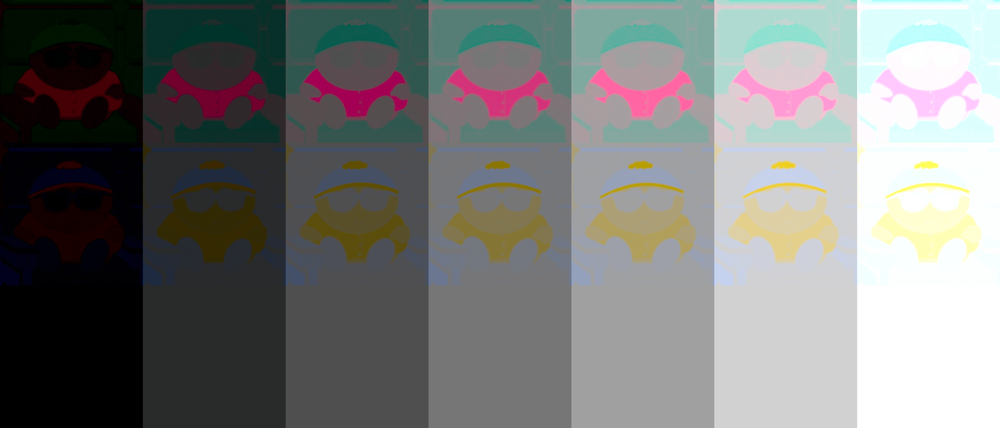

In [43]:
value = [0, 17, 34, 50, 66, 84, 100]
result = []

# simulate the effect of changing input L (dark to light) but with input_b = 0
for i in value:
    result.append(set_cielab(cielab_image, input_L=i, input_b=0))
# simulate the effect of changing input L (dark to light) but with input_a = 0
for i in value:
    result.append(set_cielab(cielab_image, input_L=i, input_a=0))
# simulate the effect of changing input L (dark to light) but with input_a = 0 and input_b = 0
for i in value:
    result.append(set_cielab(cielab_image, input_L=i, input_a=0, input_b=0))

display_image(result, 7, 3)